In [1]:
import sampling as smp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

training = pd.read_msgpack('training.bin')
training.columns

Index(['subject', 'img', 'pixels', 'maskArea', 'maskC', 'maskS', 'maskV',
       'maskContour', 'hasmask', 'XYextents', 'maskW', 'maskH'],
      dtype='object')

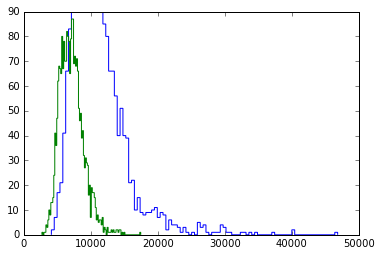

In [2]:
masks = training[training['hasmask']]
W = masks['maskW'].max(axis=0)
H = masks['maskH'].max(axis=0)
boxArea = masks['maskW'] * masks['maskH']
plt.hist(boxArea, bins=100, histtype='step')
plt.hist(masks['maskArea'], bins=100, histtype='step')
plt.show()

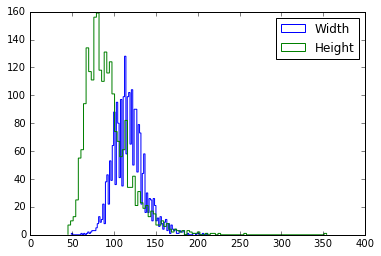

In [3]:
plt.hist(masks['maskW'], bins=100, histtype='step', label='Width')
plt.hist(masks['maskH'], bins=100, histtype='step', label='Height')
plt.legend()
plt.show()

## Look at large-area masks

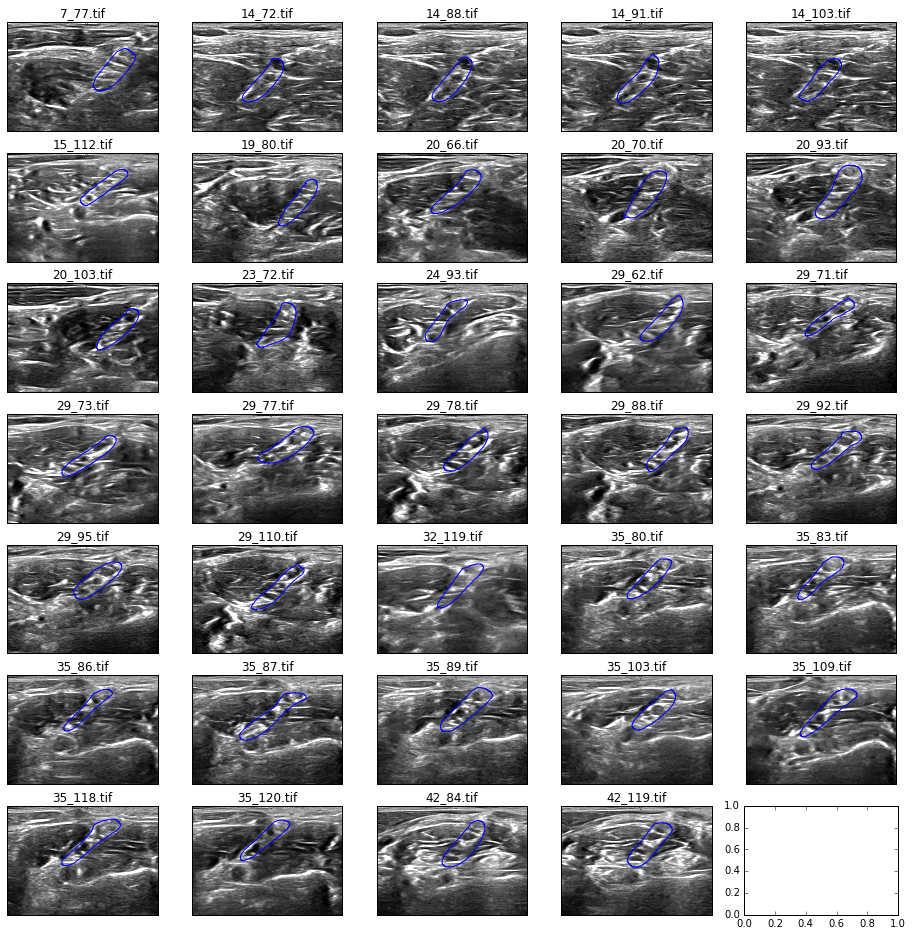

In [3]:
smp.plot_grid(masks[boxArea>25000])

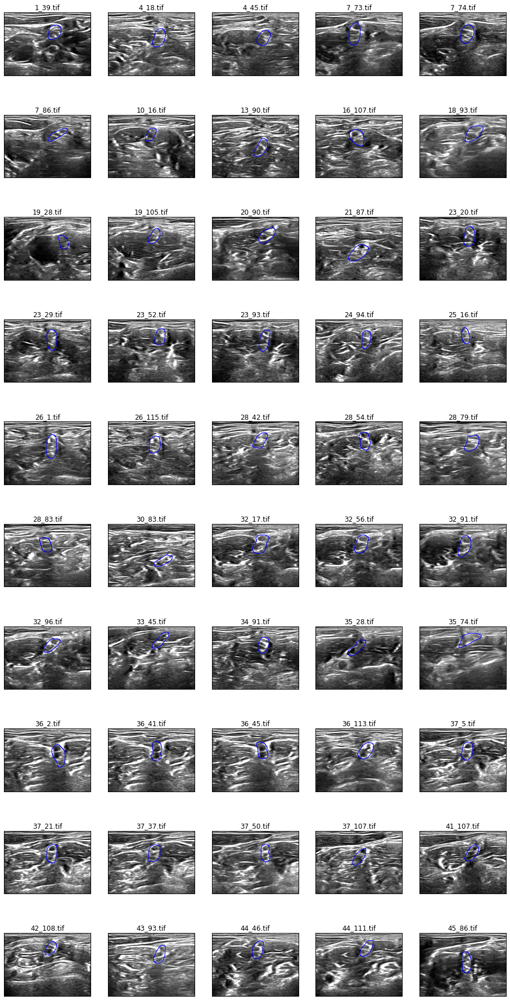

In [4]:
plot_set = masks[(boxArea>5000) & (boxArea<15000)]
# SUbset of 100 images
smp.plot_grid(plot_set.loc[np.sort(np.random.choice(plot_set.index, 50, replace=False))], ncols=5)

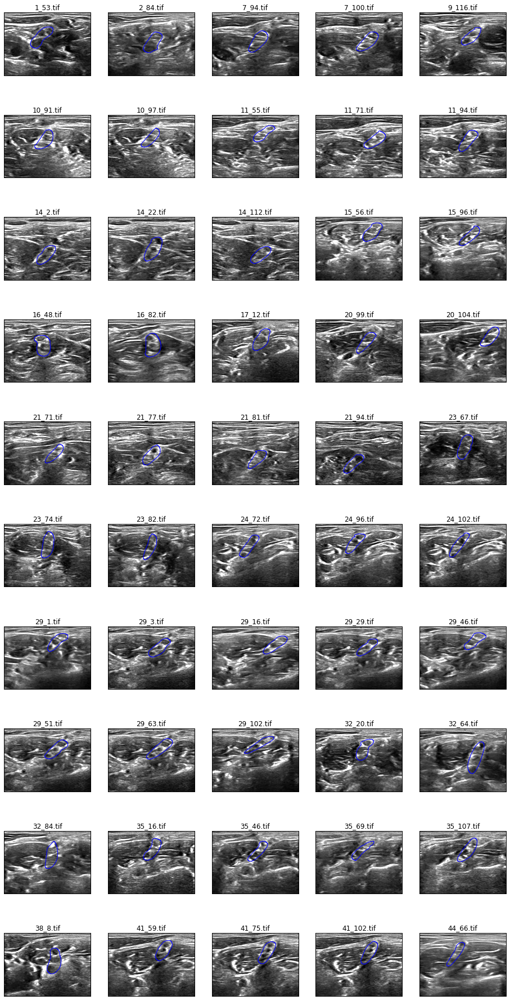

In [5]:
plot_set = masks[(boxArea>15000) & (boxArea<25000)]
smp.plot_grid(plot_set.loc[np.sort(np.random.choice(plot_set.index, 50, replace=False))])

## Histogram of images

/Users/chrisv/anaconda/lib/python3.4/site-packages/skimage/external/tifffile/tifffile.py:1794: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


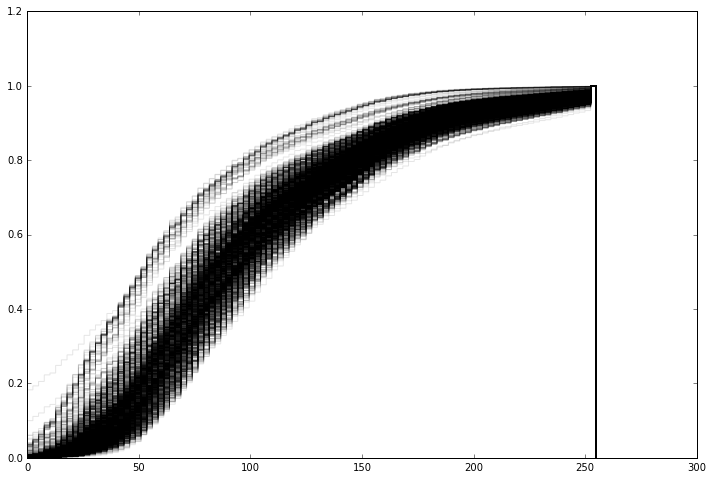

In [3]:
plot_set = masks.loc[np.sort(np.random.choice(masks.index, 2000, replace=False))]
ax = smp.plot_hist(plot_set)


## Fraction of each subject's images that have masks

<Container object of 47 artists>

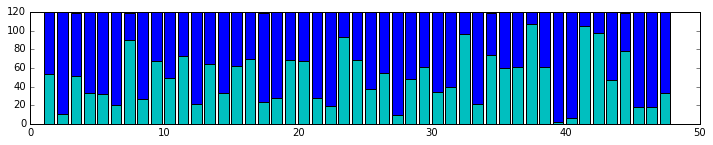

In [32]:
D = []
for subject, images in training.groupby('subject'):
    D.append([subject, len(images), np.sum(images['hasmask'])])
D = np.array(D)
fig, ax = plt.subplots(figsize=(12,2))
ax.bar(D[:,0], D[:,1])
ax.bar(D[:,0], D[:,2], color='C')

## Average images by subject

In [ ]:
for subject, images in training[training['hasmask']].groupby('subject'):
    images = smp.load_series(images)
    fig, ax = plt.subplots()
    ax.imshow(np.mean(images,axis=2), cmap=plt.cm.viridis)

/Users/chrisv/anaconda/lib/python3.4/site-packages/skimage/external/tifffile/tifffile.py:1794: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


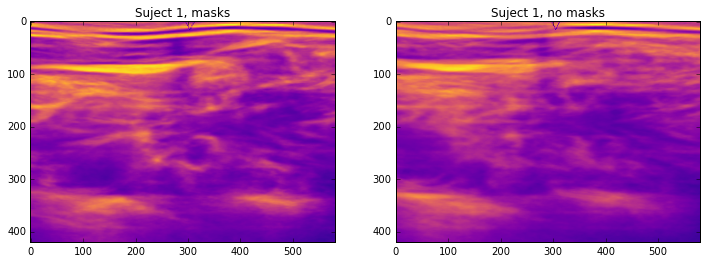

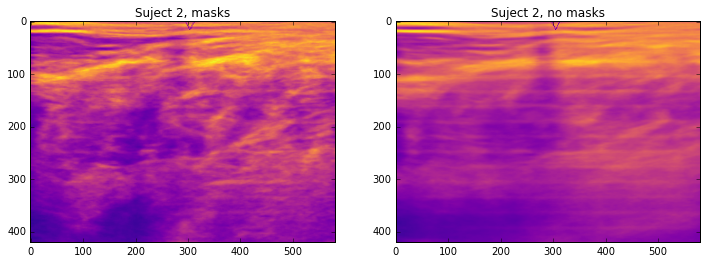

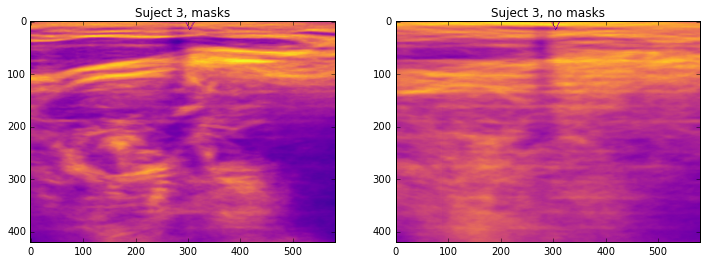

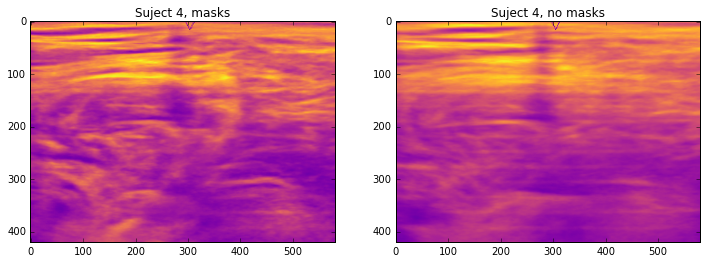

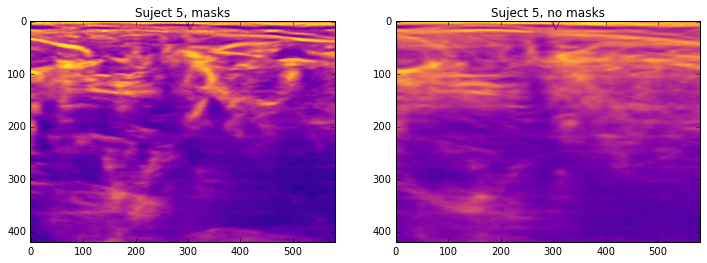

...

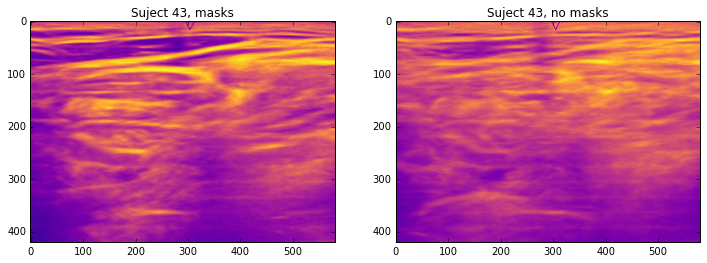

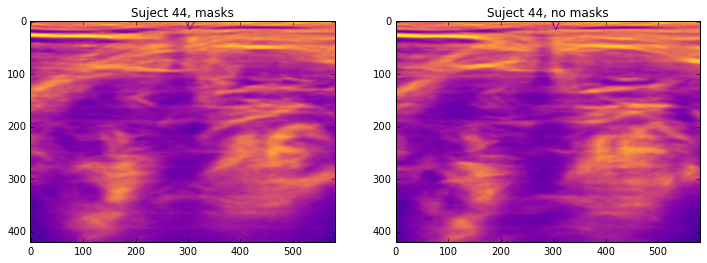

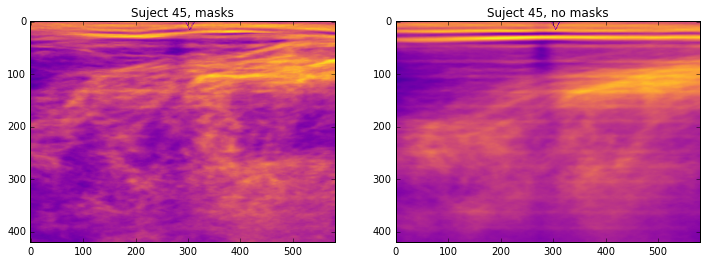

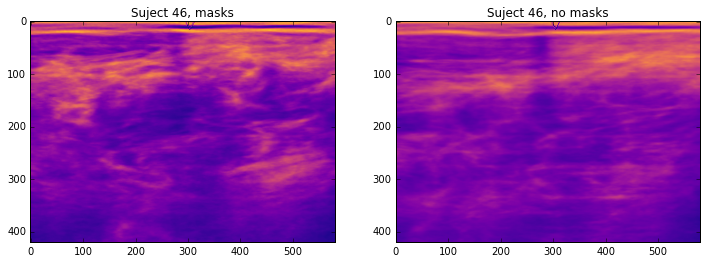

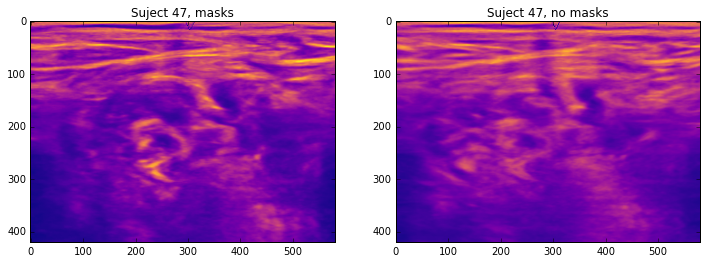

In [35]:
grouped = training.groupby(['subject'])
for subject, group in grouped:
    image0 = np.mean(smp.load_series(group[group['hasmask']]), axis=2)
    image1 = np.mean(smp.load_series(group[~group['hasmask']]), axis=2)
    fig, ax = plt.subplots(1,2, figsize=(12,4))    
    ax[0].imshow(image0, cmap=plt.cm.plasma)
    ax[1].imshow(image1, cmap=plt.cm.plasma)
    ax[0].set_title('Suject {s}, masks'.format(s=subject))
    ax[1].set_title('Suject {s}, no masks'.format(s=subject))    
    plt.show()
    plt.close()

/Users/chrisv/anaconda/lib/python3.4/site-packages/skimage/external/tifffile/tifffile.py:1794: RuntimeWarning: py_decodelzw encountered unexpected end of stream
  strip = decompress(strip)


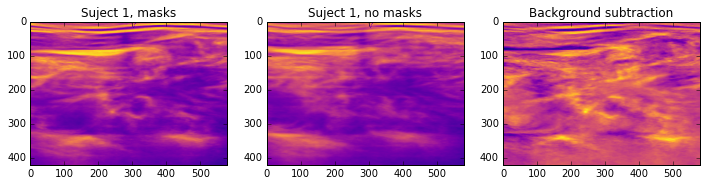

In [110]:
grouped = training.groupby(['subject'])
for subject, group in grouped:
    image0 = np.mean(smp.load_series(group[group['hasmask']]), axis=2)
    image1 = np.mean(smp.load_series(group[~group['hasmask']]), axis=2)
    fig, ax = plt.subplots(1,3, figsize=(12,4))    
    ax[0].imshow(image0, cmap=plt.cm.plasma)
    ax[1].imshow(image1, cmap=plt.cm.plasma)
    ax[2].imshow(image0-image1, cmap=plt.cm.plasma) 
    ax[0].set_title('Suject {s}, masks'.format(s=subject))
    ax[1].set_title('Suject {s}, no masks'.format(s=subject))
    ax[2].set_title('Background subtraction'.format(s=subject))
    
    plt.show()
    plt.close()
    break

(420, 580, 33)

In [48]:
np.savez_compressed('test', D)

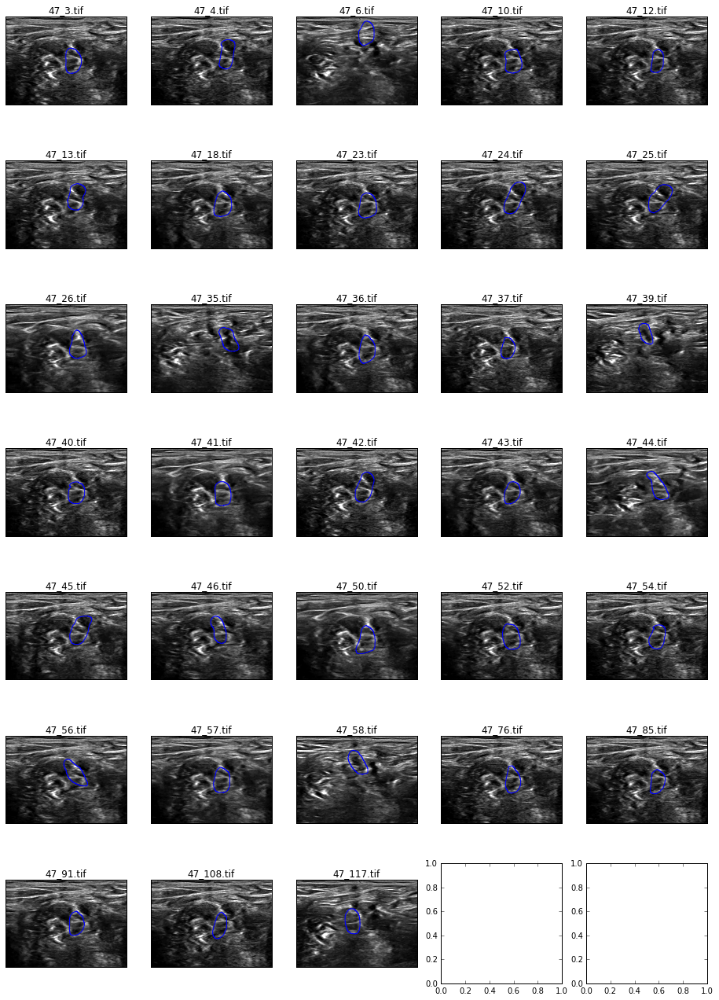

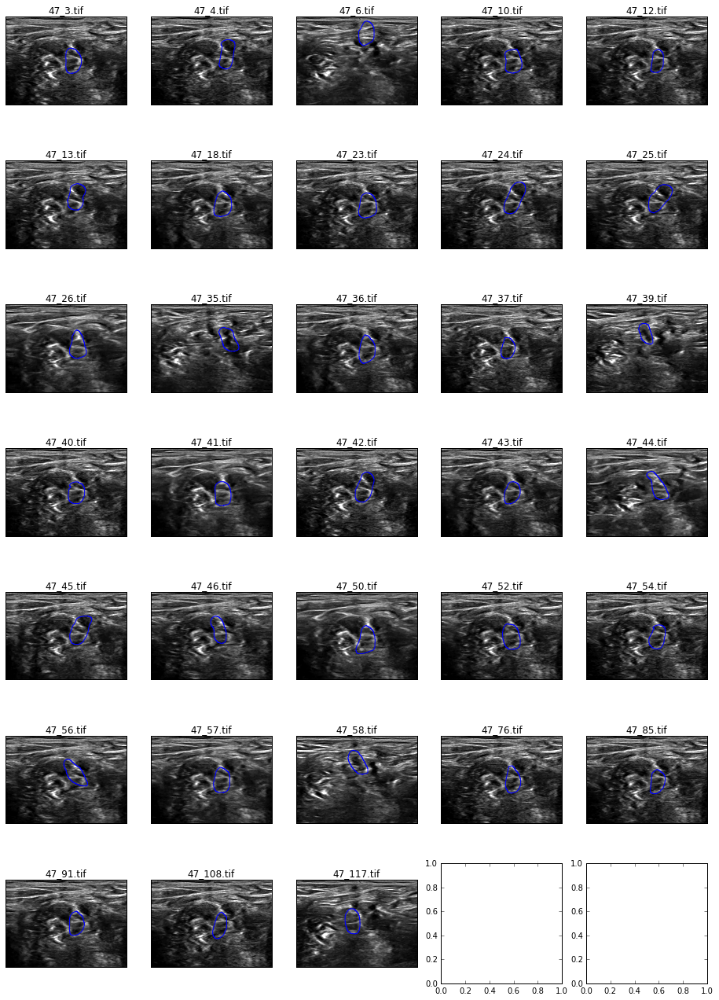

In [47]:
smp.plot_grid(group[group['hasmask']].sort_values(by='img'))

In [74]:
images = smp.load_series(group[group['hasmask']])

In [102]:
C = np.vstack(group[group['hasmask']]['maskC'].values)
shifts = (C-np.median(C,axis=0)).astype('int8')
output = np.zeros_like(images[:,:,0])
output_noshift = np.zeros_like(output)
W,H = images[:,:,0].shape
for idx, s in enumerate(shifts):
    dx, dy = s
    imW = W-abs(dx)
    imH = H-abs(dy)
    x = max(0,-dx)
    y = max(0,-dy)
    output[x:x+imW,y:y+imH] = output[x:x+imW,y:y+imH] + images[x:x+imW,y:y+imH,idx]
    output_noshift = output_noshift + images[:,:,idx]

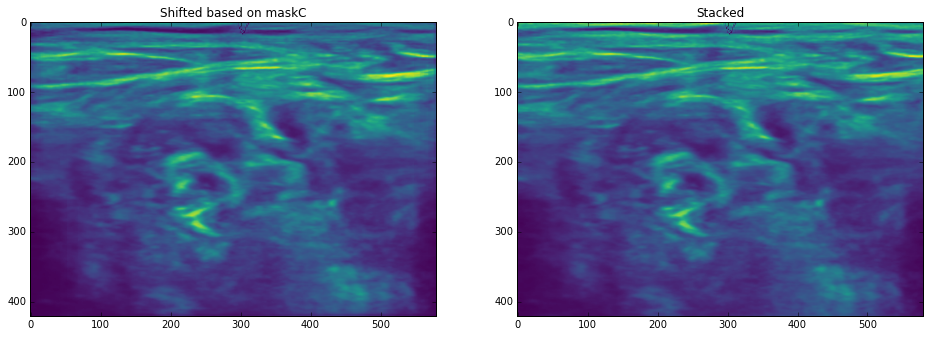

In [105]:
fig, ax = plt.subplots(1, 2, figsize=(16,9) )
ax[0].imshow(output, cmap=plt.cm.viridis)
ax[0].set_title('Shifted based on maskC')
ax[1].imshow(output_noshift, cmap=plt.cm.viridis)
ax[1].set_title('Stacked')

array([[ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       ..., 
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan],
       [ nan,  nan,  nan, ...,  nan,  nan,  nan]])